## Environmental set up

In [23]:
# env set up
# source /g/data/oe9/login_script.sh
# module load agdc-py3-prod^C
# source activate geo
# jupyter notebook
import numpy as np
import glob
import xarray as xr
import pandas as pd

import holoviews as hv
import geoviews as gv
import geoviews.feature as gf

import matplotlib
import matplotlib.pyplot as plt

hv.notebook_extension()

year = np.arange(2000,2017)
for yeari in year:
    ncpath = '/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_'+str(yeari)+'.nc'
ncpath

'/g/data/oe9/user/rg6346/NDVI_stack/MOD13A1_NDVI_EVI_2016.nc'

In [24]:
# from scipy.io import netcdf

# import netCD/F4 # import libraries
# fp='uwstemp.nc' # your file name with the eventual path
yearnc = xr.open_dataset(ncpath)
yearnc
# file2read = netcdf.NetCDFFile(ncpath,'r')
# temp = file2read.variables[var] # var can be 'Theta', 'S', 'V', 'U' etc..
# data = temp[:]*1
# file2read.close()

<xarray.Dataset>
Dimensions:                        (band: 3, time: 23, x: 3346, y: 3147)
Coordinates:
  * band                           (band) int64 1 2 3
  * y                              (y) float64 -24.59 -24.59 -24.6 -24.6 ...
  * x                              (x) float64 138.6 138.6 138.6 138.6 138.6 ...
  * time                           (time) datetime64[ns] 2016-01-01 ...
Data variables:
    __xarray_dataarray_variable__  (time, band, y, x) int16 ...

In [25]:
# ds_all=ds_all.rename({'__xarray_dataarray_variable__': 'ndvi'})
yearnc = yearnc.rename({'__xarray_dataarray_variable__': 'ndvi_evi'})
yearnc = yearnc.rename({'y': 'lat'})
yearnc = yearnc.rename({'x': 'long'})
yearnc

<xarray.Dataset>
Dimensions:   (band: 3, lat: 3147, long: 3346, time: 23)
Coordinates:
  * band      (band) int64 1 2 3
  * lat       (lat) float64 -24.59 -24.59 -24.6 -24.6 -24.6 -24.61 -24.61 ...
  * long      (long) float64 138.6 138.6 138.6 138.6 138.6 138.6 138.6 138.6 ...
  * time      (time) datetime64[ns] 2016-01-01 2016-01-17 2016-02-02 ...
Data variables:
    ndvi_evi  (time, band, lat, long) int16 ...

In [29]:
ndvi_t = yearnc.ndvi_evi.isel(band=1)/10000
ndvi_t
# ndvi.plot.imshow(col='time', robust = True, col_wrap=4, cmap = 'RdYlGn')

<xarray.DataArray 'ndvi_evi' (time: 23, lat: 3147, long: 3346)>
array([[[ 0.2029,  0.2288, ...,  0.    ,  0.    ],
        [ 0.202 ,  0.2055, ...,  0.    ,  0.    ],
        ..., 
        [ 0.    ,  0.    , ...,  0.    ,  0.    ],
        [ 0.    ,  0.    , ...,  0.    ,  0.    ]],

       [[ 0.1976,  0.206 , ...,  0.    ,  0.    ],
        [ 0.203 ,  0.203 , ...,  0.    ,  0.    ],
        ..., 
        [ 0.    ,  0.    , ...,  0.    ,  0.    ],
        [ 0.    ,  0.    , ...,  0.    ,  0.    ]],

       ..., 
       [[ 0.1804,  0.1804, ...,  0.    ,  0.    ],
        [ 0.1859,  0.186 , ...,  0.    ,  0.    ],
        ..., 
        [ 0.    ,  0.    , ...,  0.    ,  0.    ],
        [ 0.    ,  0.    , ...,  0.    ,  0.    ]],

       [[ 0.1896,  0.1933, ...,  0.    ,  0.    ],
        [ 0.1906,  0.1885, ...,  0.    ,  0.    ],
        ..., 
        [ 0.    ,  0.    , ...,  0.    ,  0.    ],
        [ 0.    ,  0.    , ...,  0.    ,  0.    ]]])
Coordinates:
    band     int64 2
  * lat  

In [27]:
%opts Image {+framewise} [colorbar=True]
%output max_frames=1000 
%output size=200
%opts Image [projection=crs.Miller()] (cmap='Greens')

In [32]:
kdims = ['time', 'long', 'lat']
vdims = ['ndvi']

sub_gv = gv.Dataset(ndvi_t, kdims=kdims, vdims=vdims)


:HoloMap   [time]
   :Image   [long,lat]   (ndvi_evi)
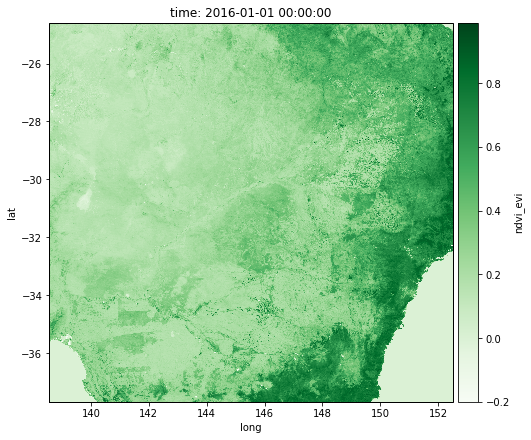
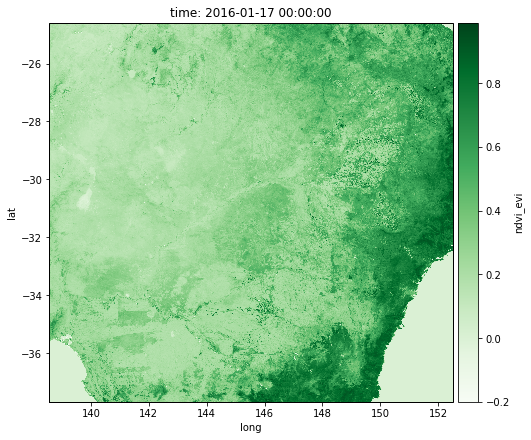
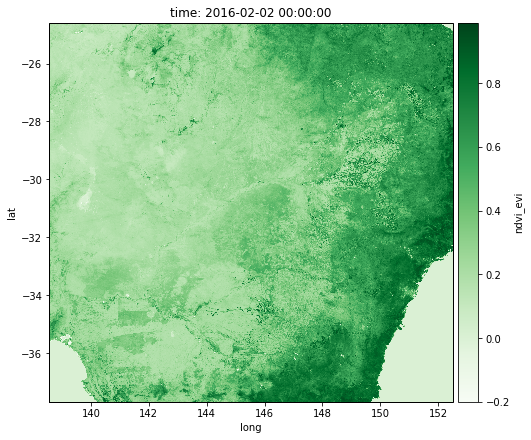
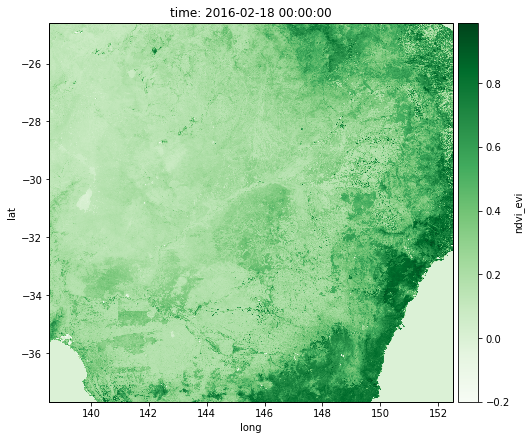
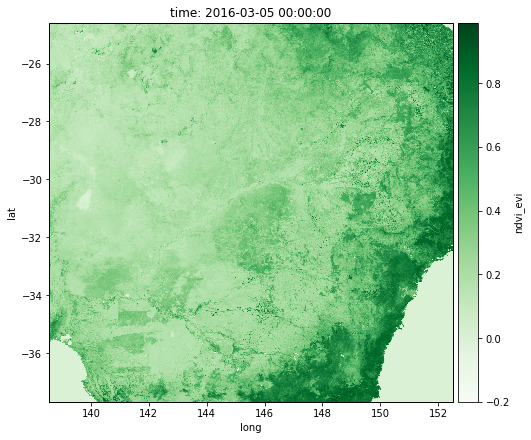
...
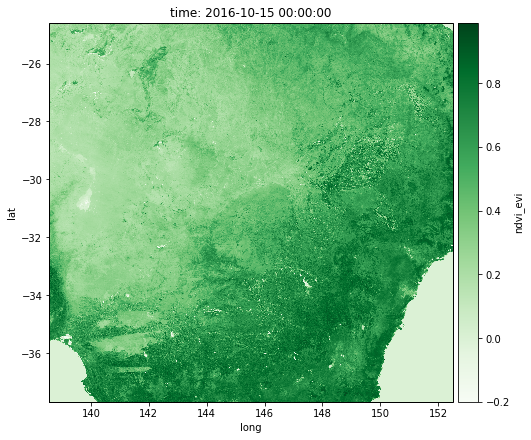
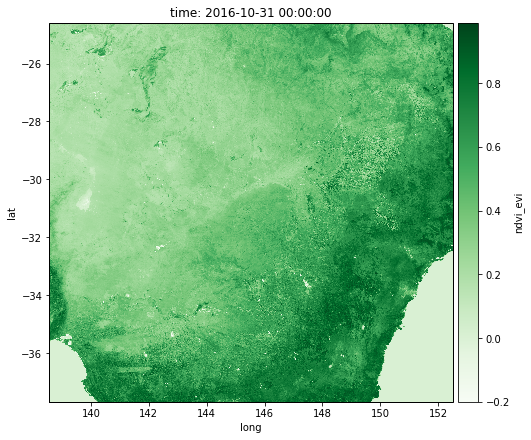
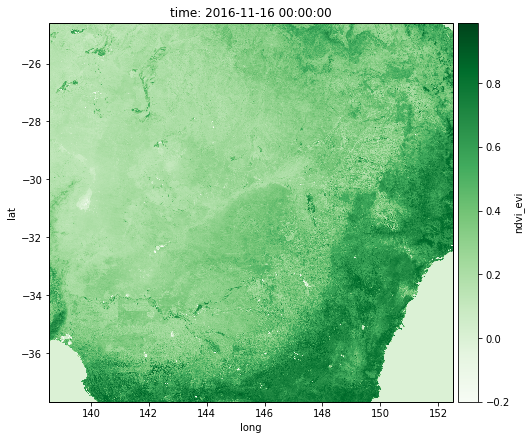
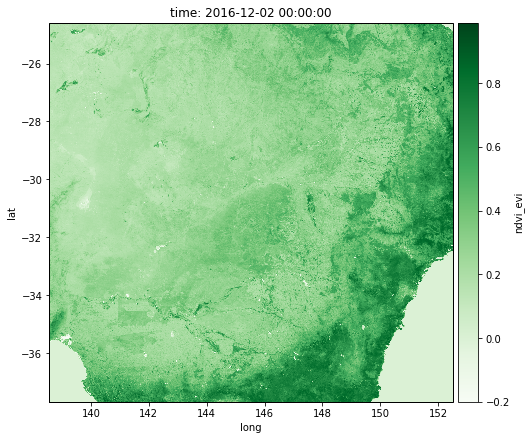
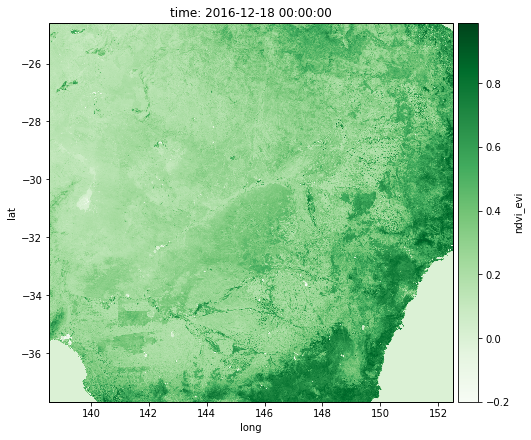

In [33]:
%%time
sub_gv.to(gv.Image, ['long', 'lat'])

### play

In [37]:
%%time
ndvi_sub_t=ndvi_t.sel(lat=slice(-30.1, -31),long=slice(148.9,150.6)) ##yarrie
ndvi_sub_t.load()

CPU times: user 2 ms, sys: 1e+03 µs, total: 3 ms
Wall time: 2.31 ms


In [38]:
sub1 = gv.Dataset(ndvi_sub_t, kdims=kdims, vdims=vdims)

:HoloMap   [time]
   :Image   [long,lat]   (ndvi_evi)
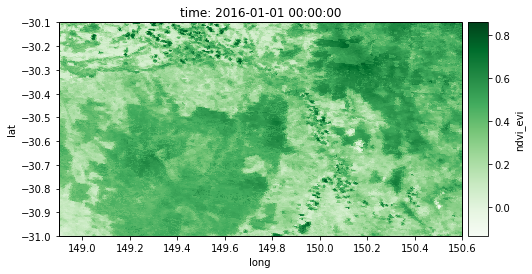
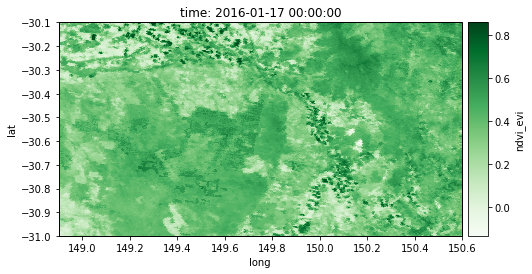
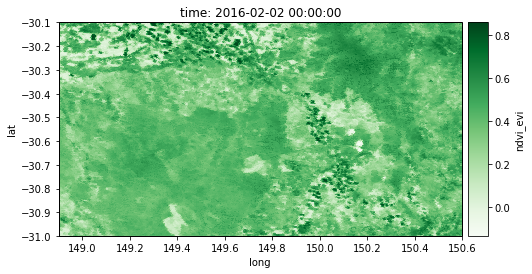
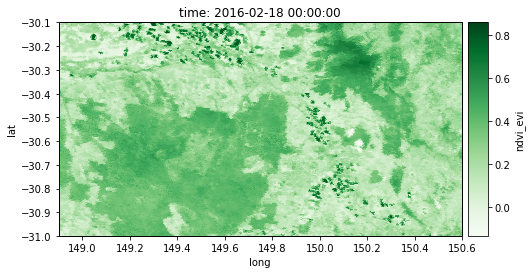
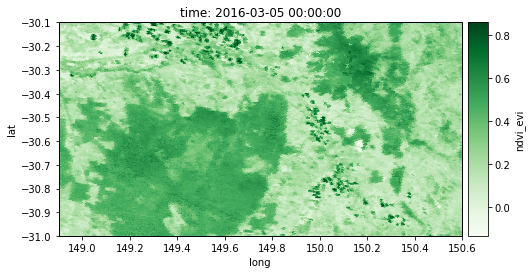
...
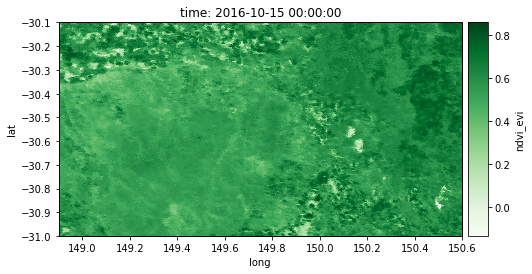
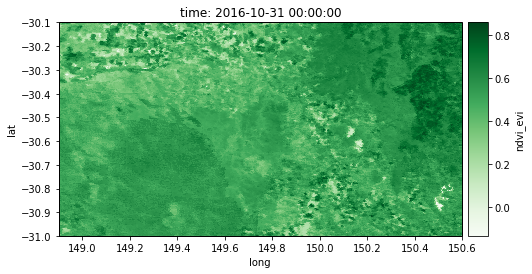
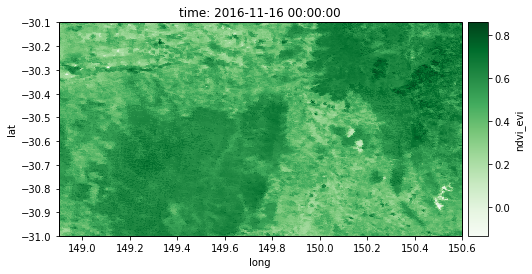
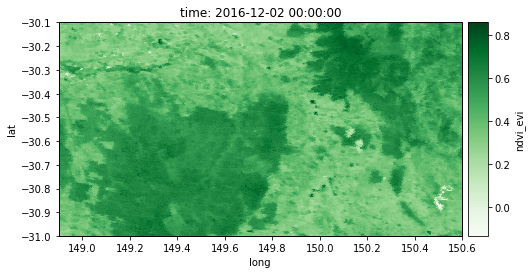
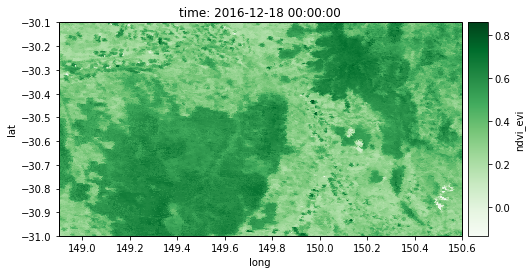

In [39]:
sub1.to(gv.Image, ['long', 'lat'])